<a href="https://colab.research.google.com/github/muiddd/5thSemester_PCVK/blob/main/Week03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

--- Mengubah tingkat kecerahan citra ---
----------------------------------------
Masukkan nilai kecerahan: 30


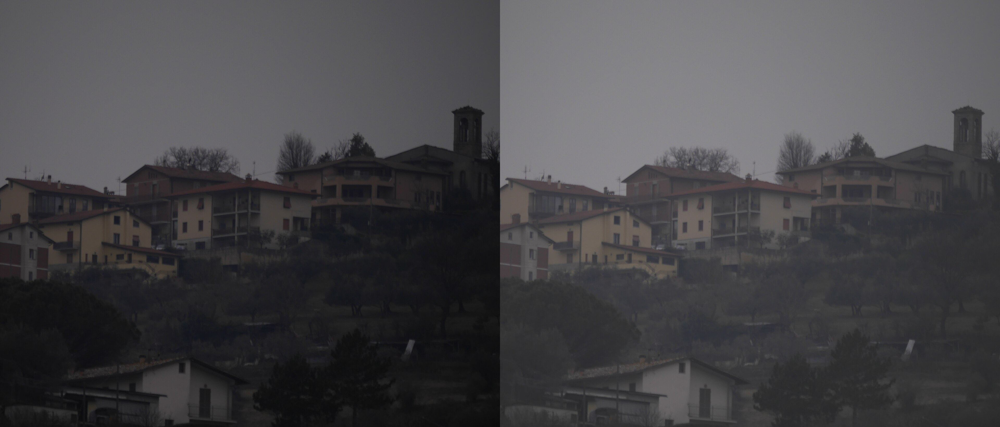

In [4]:
print('--- Mengubah tingkat kecerahan citra ---')
print('----------------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

# Sesuaikan path ini dengan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/PCVK/houses.JPG')
brightness_image = np.zeros(original.shape, original.dtype)

# Akses per piksel
# np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# Menampilkan gambar asli dan hasil berdampingan
final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

--- Tugas 1: Inverse Citra ---


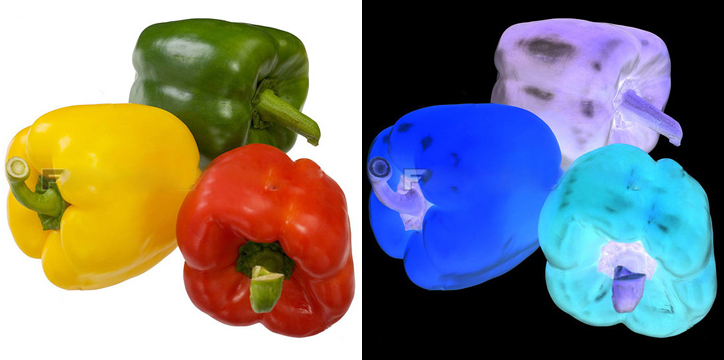

In [6]:
print('--- Tugas 1: Inverse Citra ---')

# Ganti lokasi path ini sesuai dengan gambar yang ingin kamu pakai (misalnya gambar paprika atau houses)
path_gambar = '/content/drive/MyDrive/PCVK/peppers.jpg'
original = cv.imread(path_gambar)

# Operasi Inverse: 255 dikurangi nilai piksel asli
inverse_image = 255 - original

# Menampilkan gambar asli dan hasil inverse berdampingan
final_frame = cv.hconcat((original, inverse_image))
cv2_imshow(final_frame)

--- Tugas 2: Mengubah kontras dan tingkat kecerahan citra ---
Masukkan kontras : 30


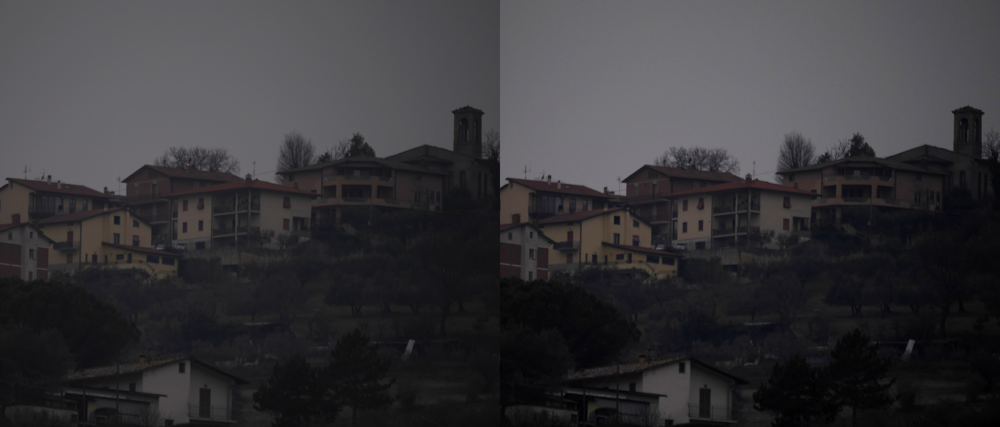

In [9]:
print('--- Tugas 2: Mengubah kontras dan tingkat kecerahan citra ---')
try:
    brightness = int(input('Masukkan tingkat kecerahan : '))
    contrast = float(input('Masukkan kontras : '))
except ValueError:
    print('Error, input tidak valid')

path_gambar = '/content/drive/MyDrive/PCVK/houses.JPG'
original = cv.imread(path_gambar)

# 1. Menghitung factor F sesuai rumus
F = (259 * (contrast + 255)) / (255 * (259 - contrast))

# 2. Mengubah tipe data ke float untuk perhitungan agar tidak error
img_float = original.astype(np.float32)

# 3. Menerapkan rumus kontras (dikurangi 128, dikali F, ditambah 128) lalu ditambah brightness
contrast_image = F * (img_float - 128) + 128 + brightness

# 4. Truncate (clip) nilai agar tetap di rentang 0-255 dan ubah kembali ke uint8
contrast_image = np.clip(contrast_image, 0, 255).astype(np.uint8)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)